# **Tarea 4: Detección de jugadores**

## Procesamiento de imágenes

### Javiera Fuentes

## **Paso 1: Cargado de imágenes**

In [1]:
from google.colab import drive
 
drive.mount('/content/drive')  

Mounted at /content/drive


In [2]:
%cd drive/MyDrive/ImagenesT2

/content/drive/MyDrive/ImagenesT2


In [46]:
import cv2
from google.colab.patches import cv2_imshow

img1 = cv2.imread('Off side 1.png', 0)
img2 = cv2.imread('Off side 2.png', 0)
img3 = cv2.imread('Off side 3.png', 0)

In [47]:
img1_c = cv2.imread('Off side 1.png')
img2_c = cv2.imread('Off side 2.png')
img3_c = cv2.imread('Off side 3.png')

## **PASO 2: Eliminación de cesped**


### Ajuste de parámetros

In [7]:
from ipywidgets import interact

def green_segmentation(i =0, l_h=30, h_h=70, l_s=40, h_s=255, l_v=40, h_v=160):
  imgs = [img1_c, img2_c, img3_c]
  tohsv = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
  negado = cv2.bitwise_not(mask)
  result = cv2.bitwise_and(imgs[i], imgs[i], mask=negado)
  cv2_imshow(result)

interact(green_segmentation, i=(0,2,1), l_h=(0,255,1), h_h=(0,255,1), l_s=(0,255,1), h_s=(0,255,1), l_v=(0,255,1), h_v=(0,255,1))

interactive(children=(IntSlider(value=0, description='i', max=2), IntSlider(value=30, description='l_h', max=2…

<function __main__.green_segmentation>

### Aplicacion

In [48]:
imgs = [img1_c, img2_c, img3_c]
def green_filter(img, bajo, alto):
  tohsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, bajo, alto)
  negado = cv2.bitwise_not(mask)
  result = cv2.bitwise_and(img, img, mask=negado)
  return result

bajo = (30,73,40)
alto = (70,255, 160)
img1_wg = green_filter(img1_c, bajo, alto)
img2_wg = green_filter(img2_c, bajo, alto)
img3_wg = green_filter(img3_c, bajo, alto)

### Preparamos las imagenes para ocupar canny

In [49]:
img1_forcanny = cv2.cvtColor(img1_wg, cv2.COLOR_BGR2GRAY)
img2_forcanny = cv2.cvtColor(img2_wg, cv2.COLOR_BGR2GRAY)
img3_forcanny = cv2.cvtColor(img3_wg, cv2.COLOR_BGR2GRAY)

## **PASO 3: Detección de bordes con Canny**


#### Ajuste de parámetros con interact

In [50]:
def canny_function(lower=0, upper=255, i=0):
  imgs = [img1_forcanny, img2_forcanny, img3_forcanny]
  result = cv2.Canny(imgs[i], lower, upper)
  cv2_imshow(result)

interact(canny_function, 
         i = (0,2,1),
         lower=(0,255, 5),
         upper=(0, 255, 5))

interactive(children=(IntSlider(value=0, description='lower', max=255, step=5), IntSlider(value=255, descripti…

<function __main__.canny_function>

#### Aplicacion de canny

In [58]:
bordes1 = cv2.Canny(img1_forcanny, 40, 85)
bordes2 = cv2.Canny(img2_forcanny, 40, 85)
bordes3= cv2.Canny(img3_forcanny, 40, 85)

In [14]:
import numpy as np

## **PASO 4: Filtros morfológicos**

#### Ajuste de parámetros con interact (dilatacion)

In [59]:
def morf(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [bordes1, bordes2, bordes3]
  dil1 = cv2.dilate(imgs[i], kernel)
  cv2_imshow(dil1)

interact(morf, x=(2,9,1), i=(0,3,1))


interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf>

#### Aplicacion de filtro de dilatacion

In [60]:
kernel = np.ones((9,9), np.uint8)
dil1 = cv2.dilate(bordes1, kernel)
dil2 = cv2.dilate(bordes2, kernel)
dil3 = cv2.dilate(bordes3, kernel)

#### Ajuste de parametros (erosion)

In [61]:
def morf2(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [dil1, dil2, dil3]
  erode1 = cv2.erode(imgs[i], kernel)
  cv2_imshow(erode1)

interact(morf2, x=(2,9,1), i=(0,3,1))

interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf2>

#### Aplicar erosión

In [62]:
kernel = np.ones((7,7), np.uint8)
erode1 = cv2.erode(dil1, kernel)
erode2 = cv2.erode(dil2, kernel)
erode3 = cv2.erode(dil3, kernel)

## **PASO 5: Encontrar contornos**


In [63]:
contours1, hierarchy1 = cv2.findContours(erode1, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours2, hierarchy2 = cv2.findContours(erode2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours3, hierarchy3 = cv2.findContours(erode3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#### Imagen de ejemplo

In [64]:
def show_contours(i=0):
    cont = [contours1, contours2, contours3]
    imgs = [img1_c, img2_c, img3_c]
    copia = imgs[i].copy()
    cv2.drawContours(copia, cont[i], -1, (0,255,0), 3)
    cv2_imshow(copia)

interact(show_contours, i=(0,2,1))

interactive(children=(IntSlider(value=0, description='i', max=2), Output()), _dom_classes=('widget-interact',)…

<function __main__.show_contours>

### **Filtrado de contornos muy pequeños**


#### Ajuste de parámetros

In [66]:
def filter_c (number=1000, number_max=2000, i=0):
  cont = [contours1, contours2, contours3]
  imgs = [img1_c, img2_c, img3_c]
  new_contours = []
  for c in cont[i]:
    calc = cv2.contourArea(c)
    if calc > number and calc < number_max:
      new_contours.append(c)
  copia = imgs[i].copy()
  cv2.drawContours(copia, new_contours, -1, (0,255,0), 3)
  print(number)
  cv2_imshow(copia)

interact(filter_c, number=(2000, 20000, 100), number_max=(10000, 2000000, 1000), i=(0,2,1))


interactive(children=(IntSlider(value=2000, description='number', max=20000, min=2000, step=100), IntSlider(va…

<function __main__.filter_c>

#### Obtención de contornos

In [68]:
def get_new_contours(contours):
  new_contours1 = []
  for c in contours:
    calc = cv2.contourArea(c)
    if calc > 2600 and calc < 241000:
      new_contours1.append(c)
  return new_contours1

new_contours1 = get_new_contours(contours1)
new_contours2 = get_new_contours(contours2)
new_contours3 = get_new_contours(contours3)

## **PASO 6: Dibujar boundingboxes**


#### Ajuste de parámetros

In [79]:
def bboxes(i=0):
  final_contours = []
  bounding_boxes = []
  imgs = [img1_c, img2_c, img3_c]
  copia2 = imgs[i].copy()
  nc = [new_contours1, new_contours2, new_contours3]
  for c in nc[i]:
    calc = cv2.contourArea(c)
    x,y,w,h = cv2.boundingRect(c)
    if (((200 < h < 300 and 200 < w < 300) or h > w) and w*h*0.2 < calc):
      final_contours.append(c)
      bounding_boxes.append([x,y,w,h])
      cv2.rectangle(copia2,(x,y),(x+w,y+h),(255,0,0),3)
  cv2_imshow(copia2)

interact(bboxes, i=(0,2,1))

interactive(children=(IntSlider(value=0, description='i', max=2), Output()), _dom_classes=('widget-interact',)…

<function __main__.bboxes>

#### Aplicacion

In [80]:
def final_contours(nc):
  final_contours = []
  for c in nc:
    x,y,w,h = cv2.boundingRect(c)
    calc = cv2.contourArea(c)
    if (((200 < h < 300 and w < 300) or h > w)  and w*h*0.2 < calc):
      final_contours.append(c)
  return final_contours

final_contours1 = final_contours(new_contours1)
final_contours2 = final_contours(new_contours2)
final_contours3 = final_contours(new_contours3)

## **PASO 7: Crear máscara de contornos**

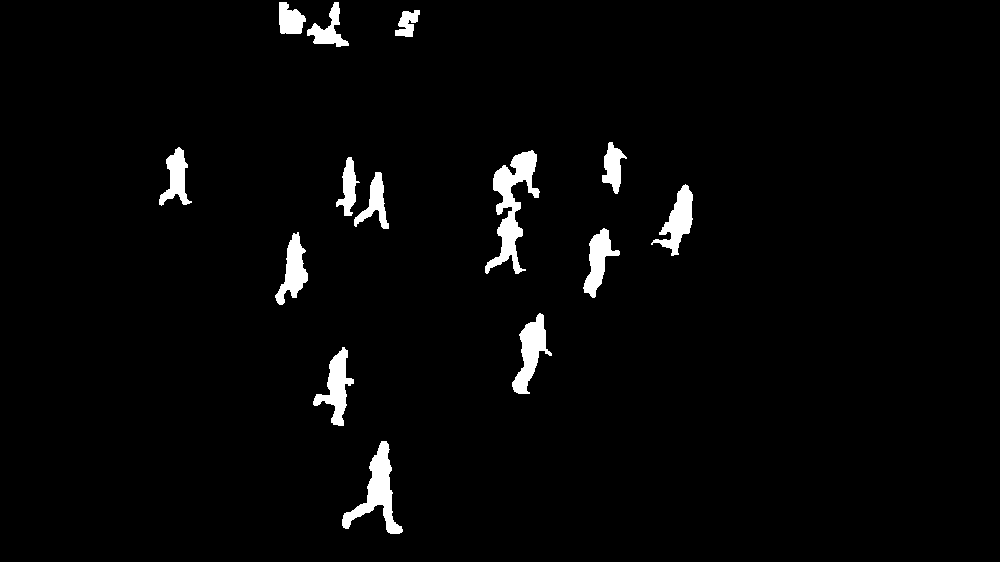

In [84]:
h, w, l  = img1_c.shape
mask = np.zeros((h, w))
cv2.drawContours(mask, final_contours1, -1, 255, thickness=cv2.FILLED)

h2, w2, l2 = img2_c.shape
mask2 = np.zeros((h2, w2))
cv2.drawContours(mask2, final_contours2, -1, 255, thickness=cv2.FILLED)

h3, w3, l3 = img3_c.shape
mask3 = np.zeros((h3, w3))
cv2.drawContours(mask3, final_contours3, -1, 255, thickness=cv2.FILLED)
cv2_imshow(mask)

## **PASO 8: Obtener máscaras de colores**

## **Para jugadores con camiseta blanca**

### Ajuste de parámetros

In [85]:
def white_segmentation(i =0, l_h=0, h_h=0, l_s=0, h_s=0, l_v=0, h_v=255):
  imgs = [img1_c, img2_c, img3_c]
  tohsv = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
  result = cv2.bitwise_and(imgs[i], imgs[i], mask=mask)
  cv2_imshow(result)

interact(white_segmentation, i=(0,2,1), l_h=(0,255,1), h_h=(0,255,1), l_s=(0,255,1), h_s=(0,255,1), l_v=(0,255,1), h_v=(0,255,1))

interactive(children=(IntSlider(value=0, description='i', max=2), IntSlider(value=0, description='l_h', max=25…

<function __main__.white_segmentation>

### Aplicación

In [86]:
def app_white_segmentation(img):
  tohsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (0, 0, 195), (151, 60, 255))
  return mask

In [87]:
white_mask = app_white_segmentation(img1_c)
white_mask2 = app_white_segmentation(img2_c)
white_mask3 = app_white_segmentation(img3_c)

### Ajuste de parametro erosion

In [88]:
def morf(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [white_mask, white_mask2, white_mask3]
  dil1 = cv2.erode(imgs[i], kernel)
  cv2_imshow(dil1)

interact(morf, x=(2,9,1), i=(0,2,1))

interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf>

### Aplicacion

In [89]:
kernel = np.ones((3, 3), np.uint8)
white_erode = cv2.erode(white_mask, kernel)
white_erode2 = cv2.erode(white_mask2, kernel)
white_erode3 = cv2.erode(white_mask3, kernel)

### Ajuste de parametro dilatacion

In [106]:
def morf(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [white_erode, white_erode2, white_erode3]
  dil1 = cv2.dilate(imgs[i], kernel)
  cv2_imshow(dil1)

interact(morf, x=(2,9,1), i=(0,2,1))

interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf>

In [91]:
kernel = np.ones((7, 7), np.uint8)
white_dil = cv2.dilate(white_erode, kernel)
white_dil2 = cv2.dilate(white_erode2, kernel)
white_dil3 = cv2.dilate(white_erode3, kernel)

### Multiplicación de mascaras

In [99]:
final_white = white_dil*mask
final_white2 = white_dil2*mask2
final_white3 = white_dil3*mask3

In [100]:
def show_func(i=0):
  imgs = [final_white, final_white2, final_white3]
  cv2_imshow(imgs[i])

interact(show_func, i=(0,2,1))

interactive(children=(IntSlider(value=0, description='i', max=2), Output()), _dom_classes=('widget-interact',)…

<function __main__.show_func>

## **Para jugadores con camiseta roja**

### Ajuste de parámetros

In [95]:
def red_segmentation(i =0, l_h=0, h_h=0, l_s=0, h_s=0, l_v=0, h_v=255):
  imgs = [img1_c, img2_c, img3_c]
  tohsv = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
  result = cv2.bitwise_and(imgs[i], imgs[i], mask=mask)
  cv2_imshow(result)

interact(red_segmentation, i=(0,2,1), l_h=(0,255,1), h_h=(0,255,1), l_s=(0,255,1), h_s=(0,255,1), l_v=(0,255,1), h_v=(0,255,1))

interactive(children=(IntSlider(value=0, description='i', max=2), IntSlider(value=0, description='l_h', max=25…

<function __main__.red_segmentation>

### Aplicacion

In [116]:
def app_red_segmentation(img):
  tohsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (0, 100, 20), (29, 255, 255))
  return mask

In [117]:
red_mask = app_red_segmentation(img1_c)
red_mask2 = app_red_segmentation(img2_c)
red_mask3 = app_red_segmentation(img3_c)

### Ajuste de parámetros dilatacion

In [107]:
def morf(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [red_mask, red_mask2, red_mask3]
  dil1 = cv2.dilate(imgs[i], kernel)
  cv2_imshow(dil1)

interact(morf, x=(2,9,1), i=(0,2,1))

interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf>

### Aplicacion dilatación

In [118]:
kernel = np.ones((8, 8), np.uint8)
red_dil = cv2.dilate(red_mask, kernel)
red_dil2 = cv2.dilate(red_mask2, kernel)
red_dil3 = cv2.dilate(red_mask3, kernel)

### Ajuste de parámetros erosión

In [112]:
def morf(x=2, i=0):
  kernel = np.ones((x, x), np.uint8)
  imgs = [red_dil, red_dil2, red_dil3]
  dil1 = cv2.erode(imgs[i], kernel)
  cv2_imshow(dil1)

interact(morf, x=(2,9,1), i=(0,2,1))

interactive(children=(IntSlider(value=2, description='x', max=9, min=2), IntSlider(value=0, description='i', m…

<function __main__.morf>

### Aplicacion

In [119]:
kernel = np.ones((8, 8), np.uint8)
red_erode = cv2.erode(red_dil, kernel)
red_erode2 = cv2.erode(red_dil2, kernel)
red_erode3 = cv2.erode(red_dil3, kernel)

### Multiplicación de mascaras

In [120]:
final_red = red_erode*mask
final_red2 = red_erode2*mask2
final_red3 = red_erode3*mask3

In [121]:
def show_red(i=0):
  imgs = [final_red, final_red2, final_red3]
  cv2_imshow(imgs[i])

interact(show_red, i=(0,2,1))

interactive(children=(IntSlider(value=0, description='i', max=2), Output()), _dom_classes=('widget-interact',)…

<function __main__.show_red>